In [1]:
from IPython.display import Image
import torch
import numpy as np
import pandas as pd
from torch import nn

# Variational Autoencoder (VAE)

## Generative model

В классическом ML рассматриваются дискриминативные модели.

**Различающие (дискриминативные) модели** - *discriminative model* - класс моделей, которые обучают условное распределение данных $P(Y|X=x)$. 

То есть они учатся моделировать условную вероятность метки класса $y$ с учетом набора характеристик $x$.


**Порождающие (генеративные) модели** - *generative model* - класс моделей, которые обучают совместное распределение данных $P(X, Y)$. Из совместного распределения можно легко получить условное распределение $P(Y|X) = \frac{P(X, Y)}{P(X)}$, что позволит свести этот класс моделей к дискриминативным. Вычислить $P(X)$ из предыдущей формулы, зная совместное распределение можно следующим образом: $P(X)=\sum\limits_yP(X, Y = y)$.

Однако, на самом деле, совместное распределение дает больше информации и эту информацию можно использовать для решения других задач.

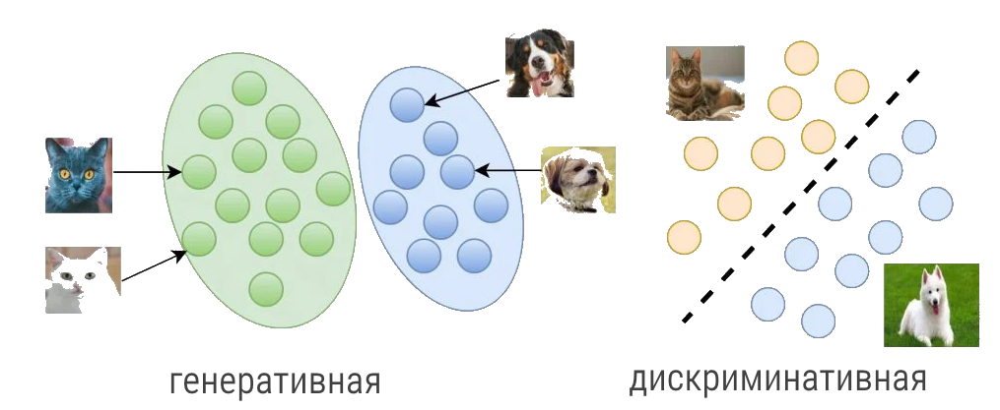

In [2]:
Image('images/gen1.png')

## Проблемы на практике (абьюз картинок)

1. Пусть у нас есть картинка, которую дискриминативная модель распознает, как кошку с очень большой вероятностью.

2. Добавим к ней невидимый шум, в результате чего визуально картинка не изменится.

3. Однако, наша дискриминативная модель может распознавать всю ту же кошку, например, как лошадь с очень большой вероятностью.

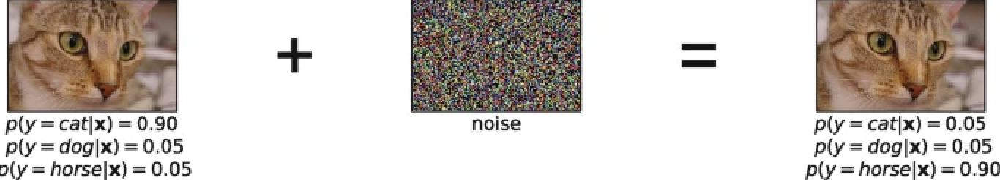

In [3]:
Image('images/gen2.png')

## Автоэнкодер - дискриминативная модель. А как сделать его генеративным?

Что мы хотим? Чтобы между кластерами в автоэнкодере не было существенных дырок. Чтобы наше простронство было непрерывным и из любой точки мы могли понять какой это объект.

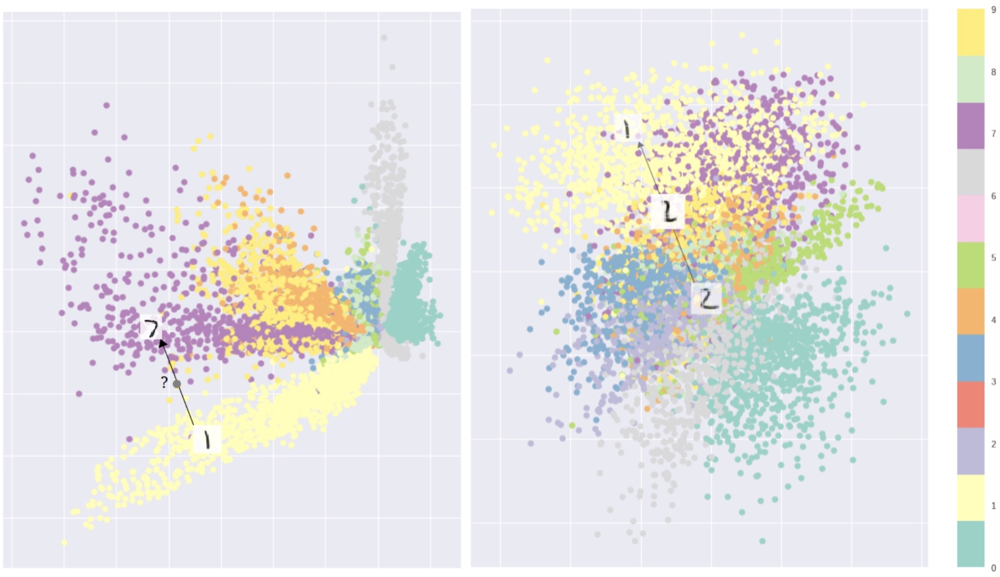

In [4]:
Image('images/mnist1.png', width=800)

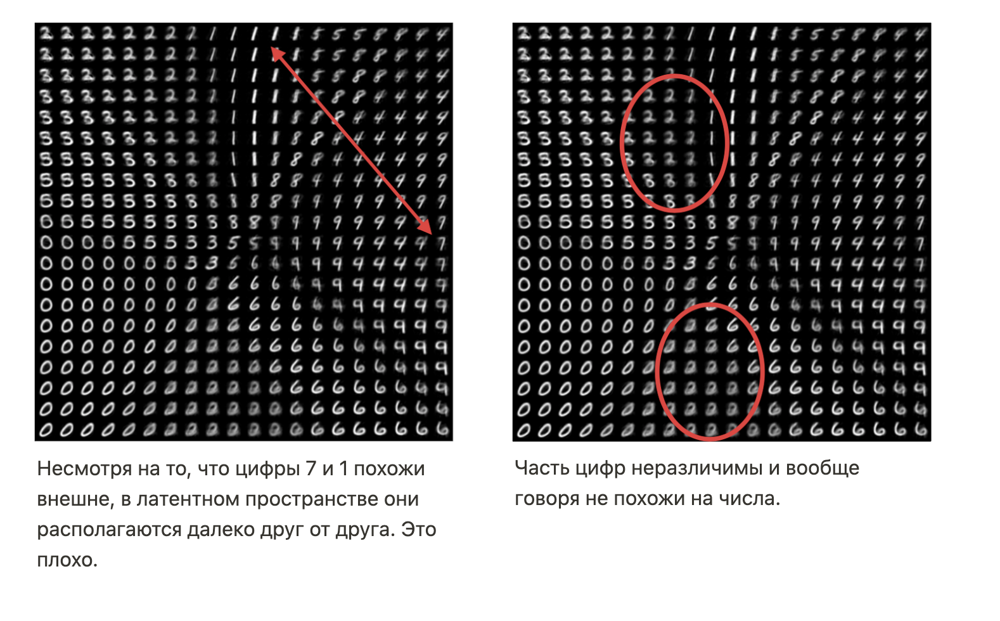

In [5]:
Image('images/gen3.png', width=1000)

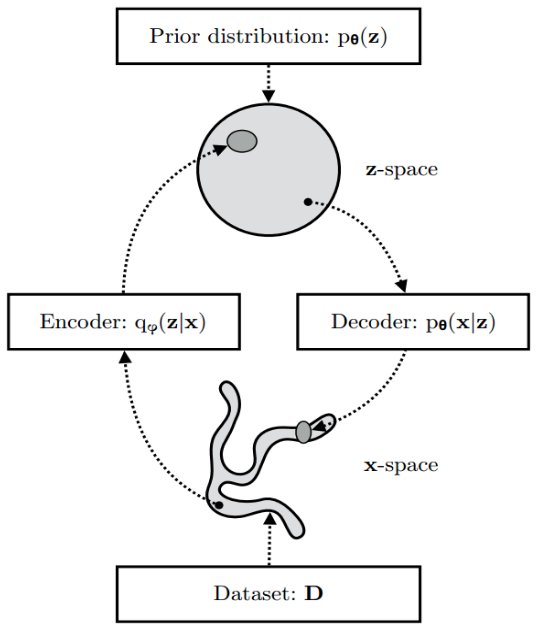

In [6]:
Image('images/vae1.png', width=400)

# Variational Autoencoder

**Идея** - а давайте для кажого сэмпла искать не сжатое представление, а некоторую **область**. Чем ближе к центру области, тем лучше, но нам нужна не **точка**, а целая **область**.

<img src="https://cdn-images-1.medium.com/max/1000/1*96ho7qSyW0nKrLvSoZHOtA.png">

Давайте будем предсказывать **нормальное распределение** для каждого объекта. Тогда, чтобы задать область нам потребуется всего 2 параметра: матожидание и стандартное отклонение.


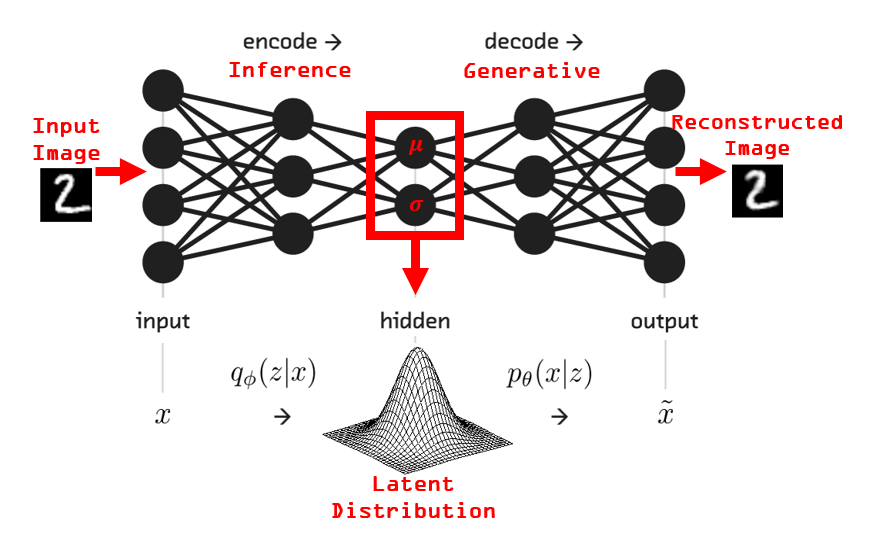

In [7]:
Image('images/vae2.png', width=1000)

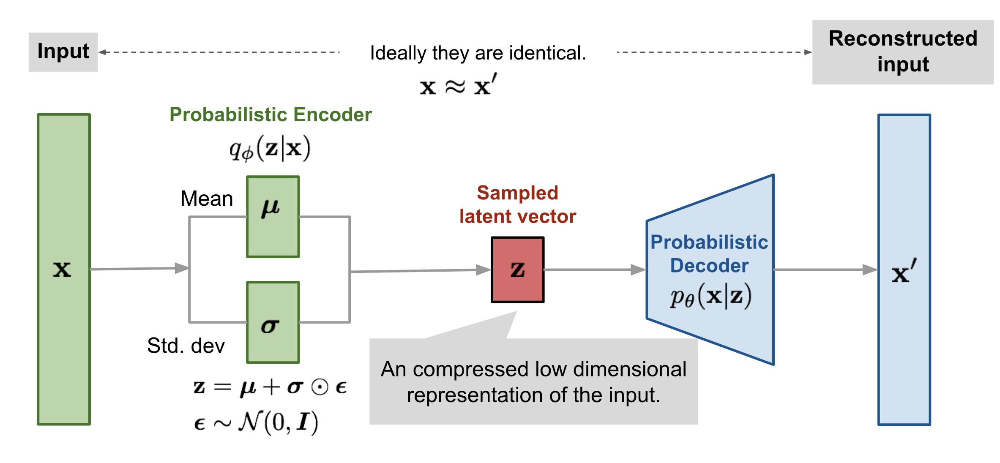

In [8]:
Image('images/vae3.png', width=1000)

А как обучать распределение? Как провести backprop по операции сэмплинга?

### Reparametrization trick

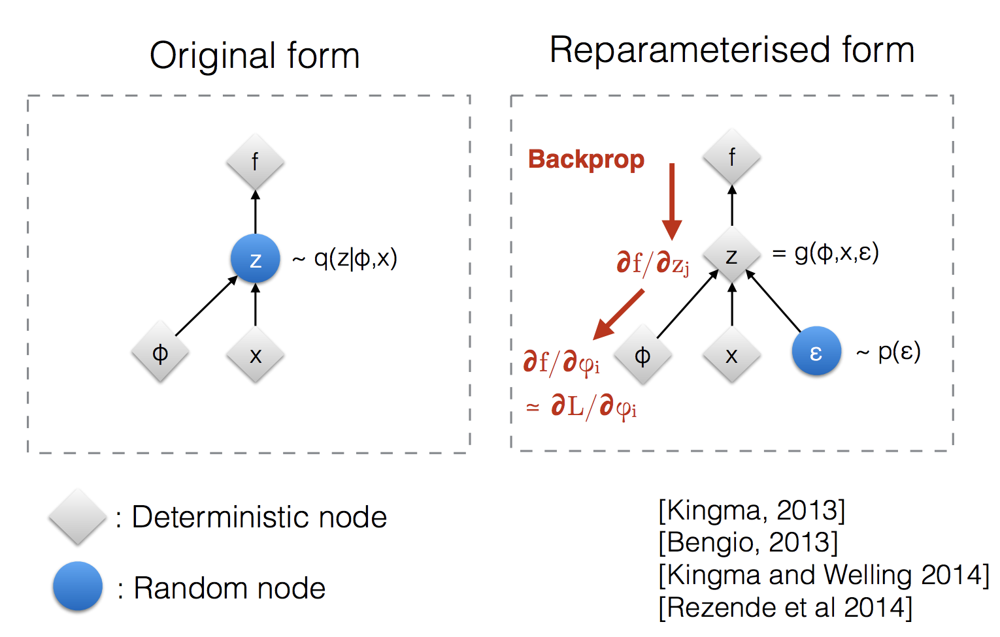

In [9]:
Image('images/vae6.png', width=1000)

### Лоссы для распределений. ELBO, KL-дивергенция

Это все, конечно хорошо, но пока нам никто не гарантирует, что кластеры будут лежать **близко** и **непрерывно друг к другу**.

Давайте придумаем такой дополнительный Loss, чтобы объекты лежали близко друг к другу.

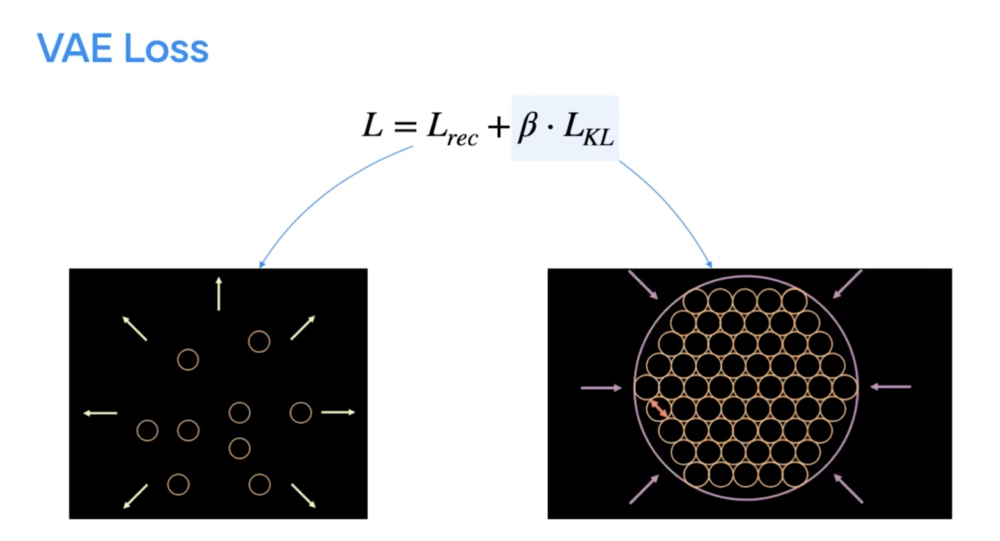

In [10]:
Image('images/vae7.png', width=1000)

**Идея** - сделаем регуляризацию, которая будет **стремить** каждое наше распределение к $\mathcal{N}(0,1)$

Как бы нам посчитать уровень различий между двумя распределениями?

### KL-дивергенция - подобие энтропии между 2-мя распределениями

$$KL (p||q) = \int_{x \in \mathcal{X}} p(x) \log \left(\frac{q(x)}{p(x)}\right)dx = \mathbb{E}_{x \sim p} \log \left(\frac{q(x)}{p(x)}\right)$$

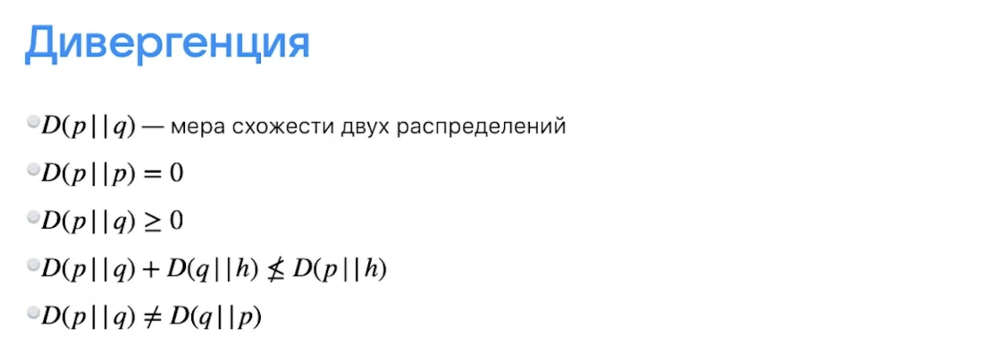

In [11]:
Image('images/kl1.png', width=1000)

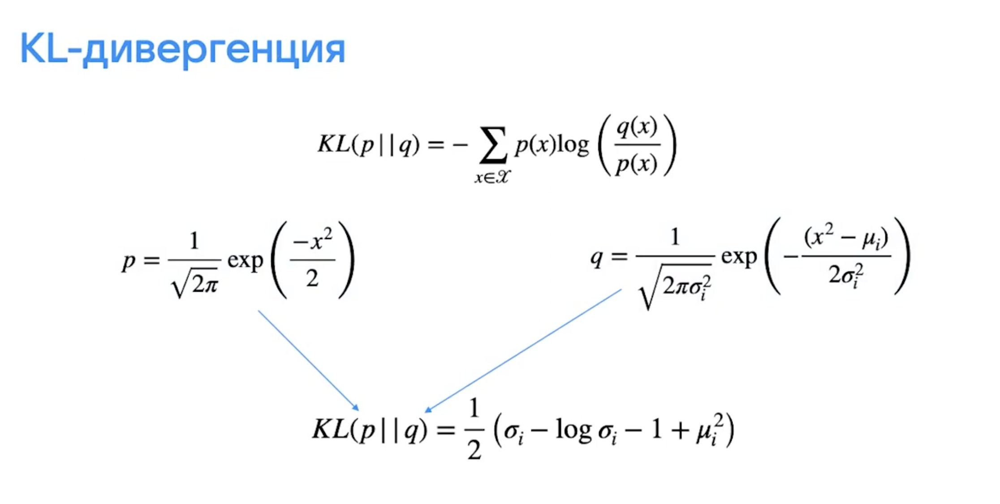

In [12]:
Image('images/kl2.png', width=1000)

Итого для нашей модели мы возьмем дополнительный лосс 

$$L_{KL} = \frac{1}{2}(\sigma_i - \log\sigma_i - 1 + \mu_i^2)$$

## Какой результат мы от всего этого получим?

### Непрерывное латентное пространство объектов

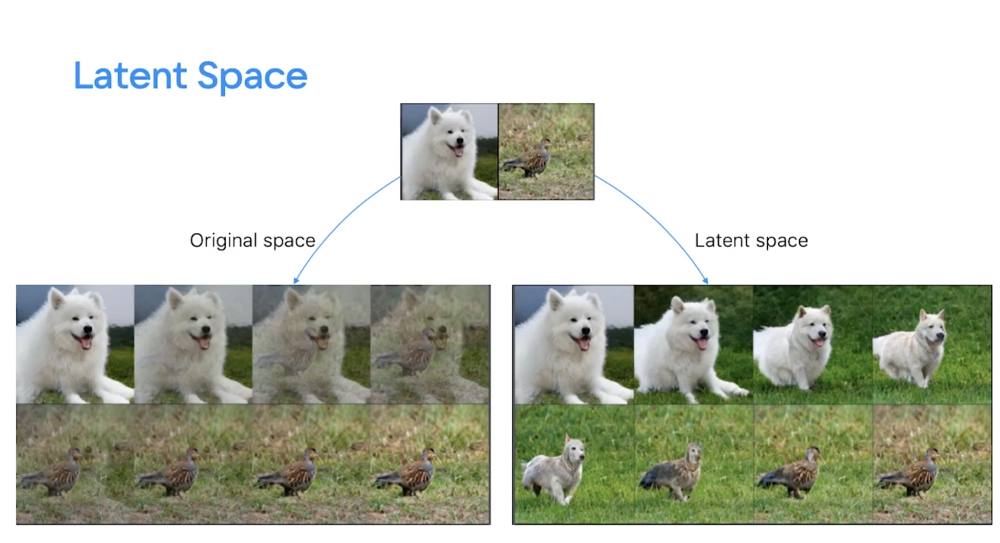

In [13]:
Image('images/vae10.png', width=1000)

### Эмбеддинги объектов изображений

## Переделаем наш пример с одеждой

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split

import time
import torchvision
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import ExponentialLR
from IPython.display import clear_output
import tqdm
%matplotlib inline

## Load the dataset
To start, you will train the basic autoencoder using the Fashion MNIST dataset. Each image in this dataset is 28x28 pixels. 

In [15]:
# Download and load the training data
trainset = datasets.FashionMNIST('./data', download=True, train=True, transform=transforms.ToTensor())

# Download and load the test data
testset = datasets.FashionMNIST('./data', download=True, train=False, transform=transforms.ToTensor())

x_train = torch.Tensor([x.numpy() for x, y in trainset][:20000])
x_test  = torch.Tensor([x.numpy() for x, y in testset ][:200])
y_test = testset.targets[:200]

/tmp/ipykernel_90227/788564944.py:7: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  x_train = torch.Tensor([x.numpy() for x, y in trainset][:20000])


In [16]:
train_set = torch.utils.data.TensorDataset(x_train, x_train)
train_set, val_set = torch.utils.data.random_split(train_set, [round(len(train_set) * 0.8), round(len(train_set) * 0.2)])
test_set = torch.utils.data.TensorDataset(x_test, x_test)

dataloaders = {
  'train': torch.utils.data.DataLoader(train_set, batch_size=128, shuffle=True),
  'val'  : torch.utils.data.DataLoader(val_set, batch_size=128, shuffle=False),
  'test' : torch.utils.data.DataLoader(test_set, batch_size=1, shuffle=False)
}

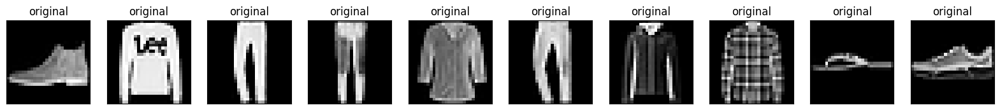

In [17]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
  # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i][0])
    plt.title("original")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Model


In [18]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)


class UnFlatten(nn.Module):
    def forward(self, input, size=32):
        return input.view(input.size(0), size, 1, 1)

In [19]:
class VAE(nn.Module):
    def __init__(self, image_channels=1, h_dim=32, z_dim=32):
        super().__init__()
        
        self.encoder = nn.Sequential( #1x28x28
            nn.Conv2d(image_channels, 32, kernel_size=(2,2), stride=2), #32x14x14
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=(3,3), stride=2), #32x6x6
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=(2,2), stride=2), #32x3x3
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=(3,3)), #32x1x1
            nn.ReLU(),
            Flatten()
        )
        
        self.h2mu = nn.Linear(h_dim, z_dim)
        self.h2sigma = nn.Linear(h_dim, z_dim)
        self.z2h = nn.Linear(z_dim, h_dim)
        
        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(h_dim, 32, kernel_size=(3,3)),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 32, kernel_size=(2,2), stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 32, kernel_size=(3,3), stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=(4,4), stride=2),
            nn.Sigmoid(),
        )
        
    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.randn(*mu.size())
        z = mu + std * eps #sampling
        return z
    
    def bottleneck(self, h):
        mu = self.h2mu(h)
        logvar = self.h2sigma(h)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar
        
    def encode(self, x):
        return self.bottleneck(self.encoder(x))[0]

    def decode(self, z):
        return self.decoder(self.z2h(z))
    
    def forward(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        z = self.z2h(z)
        return self.decoder(z), mu, logvar

In [20]:
def vae_loss(recon_x, x, mu, logvar, beta=10) -> float:
    BCE = F.binary_cross_entropy(recon_x.view(-1, 128 * 28 * 28),
                                 x.view(-1, 128 * 28*28), reduction='sum')
    
    KLD = -0.5 * beta * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE  + KLD

## Training

In [21]:
model = VAE(z_dim=2)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
scheduler=ExponentialLR(optimizer, gamma=0.999)

In [22]:
num_epochs = 100

for epoch in range(num_epochs):
    train_loss = 0
    for image, _ in tqdm.tqdm(dataloaders['train']):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(image)
        loss = vae_loss(recon_batch, image, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()
    scheduler.step()
        
    print('epoch %d, loss %.4f' % (epoch, train_loss))

model.eval()

100%|██████████| 125/125 [00:01<00:00, 105.38it/s]


epoch 0, loss 6678855.7148


100%|██████████| 125/125 [00:01<00:00, 108.41it/s]


epoch 1, loss 5240205.8711


100%|██████████| 125/125 [00:01<00:00, 104.64it/s]


epoch 2, loss 5118543.6367


100%|██████████| 125/125 [00:01<00:00, 97.66it/s] 


epoch 3, loss 5053693.4922


100%|██████████| 125/125 [00:01<00:00, 107.18it/s]


epoch 4, loss 5004784.4453


100%|██████████| 125/125 [00:01<00:00, 90.52it/s]


epoch 5, loss 4981383.0547


100%|██████████| 125/125 [00:01<00:00, 91.33it/s]


epoch 6, loss 4966178.4766


100%|██████████| 125/125 [00:01<00:00, 103.46it/s]


epoch 7, loss 4949343.3438


100%|██████████| 125/125 [00:01<00:00, 90.65it/s]


epoch 8, loss 4937196.9062


100%|██████████| 125/125 [00:01<00:00, 98.07it/s] 


epoch 9, loss 4930093.9141


100%|██████████| 125/125 [00:01<00:00, 97.68it/s]


epoch 10, loss 4922187.2070


100%|██████████| 125/125 [00:01<00:00, 107.37it/s]


epoch 11, loss 4917072.1172


100%|██████████| 125/125 [00:01<00:00, 101.77it/s]


epoch 12, loss 4908726.5977


100%|██████████| 125/125 [00:01<00:00, 114.05it/s]


epoch 13, loss 4898940.6094


100%|██████████| 125/125 [00:01<00:00, 103.33it/s]


epoch 14, loss 4900581.6406


100%|██████████| 125/125 [00:01<00:00, 99.07it/s] 


epoch 15, loss 4888785.7227


100%|██████████| 125/125 [00:01<00:00, 110.16it/s]


epoch 16, loss 4886394.7266


100%|██████████| 125/125 [00:01<00:00, 102.19it/s]


epoch 17, loss 4881633.4844


100%|██████████| 125/125 [00:01<00:00, 112.53it/s]


epoch 18, loss 4879257.1016


100%|██████████| 125/125 [00:01<00:00, 112.73it/s]


epoch 19, loss 4874366.1445


100%|██████████| 125/125 [00:01<00:00, 106.52it/s]


epoch 20, loss 4873967.3516


100%|██████████| 125/125 [00:01<00:00, 100.05it/s]


epoch 21, loss 4873036.8203


100%|██████████| 125/125 [00:01<00:00, 114.27it/s]


epoch 22, loss 4866934.5234


100%|██████████| 125/125 [00:01<00:00, 111.57it/s]


epoch 23, loss 4865593.2383


100%|██████████| 125/125 [00:01<00:00, 93.76it/s]


epoch 24, loss 4863705.5977


100%|██████████| 125/125 [00:01<00:00, 103.65it/s]


epoch 25, loss 4857174.1562


100%|██████████| 125/125 [00:01<00:00, 109.12it/s]


epoch 26, loss 4856434.0078


100%|██████████| 125/125 [00:01<00:00, 98.85it/s]


epoch 27, loss 4856868.7188


100%|██████████| 125/125 [00:01<00:00, 105.33it/s]


epoch 28, loss 4850813.1016


100%|██████████| 125/125 [00:01<00:00, 105.71it/s]


epoch 29, loss 4855526.6328


100%|██████████| 125/125 [00:01<00:00, 100.22it/s]


epoch 30, loss 4854112.6094


100%|██████████| 125/125 [00:01<00:00, 105.69it/s]


epoch 31, loss 4850423.5234


100%|██████████| 125/125 [00:01<00:00, 103.35it/s]


epoch 32, loss 4850078.7109


100%|██████████| 125/125 [00:01<00:00, 110.20it/s]


epoch 33, loss 4845414.7578


100%|██████████| 125/125 [00:01<00:00, 109.10it/s]


epoch 34, loss 4842677.7812


100%|██████████| 125/125 [00:01<00:00, 109.96it/s]


epoch 35, loss 4840149.2266


100%|██████████| 125/125 [00:01<00:00, 110.75it/s]


epoch 36, loss 4839522.9648


100%|██████████| 125/125 [00:01<00:00, 111.32it/s]


epoch 37, loss 4844568.0547


100%|██████████| 125/125 [00:01<00:00, 113.43it/s]


epoch 38, loss 4840826.8281


100%|██████████| 125/125 [00:01<00:00, 112.08it/s]


epoch 39, loss 4835579.1992


100%|██████████| 125/125 [00:01<00:00, 88.39it/s]


epoch 40, loss 4834359.3047


100%|██████████| 125/125 [00:01<00:00, 96.99it/s] 


epoch 41, loss 4839723.3633


100%|██████████| 125/125 [00:01<00:00, 113.97it/s]


epoch 42, loss 4835841.4922


100%|██████████| 125/125 [00:01<00:00, 113.74it/s]


epoch 43, loss 4835657.3828


100%|██████████| 125/125 [00:01<00:00, 111.47it/s]


epoch 44, loss 4839401.8125


100%|██████████| 125/125 [00:01<00:00, 110.24it/s]


epoch 45, loss 4833496.3438


100%|██████████| 125/125 [00:01<00:00, 111.45it/s]


epoch 46, loss 4828427.9961


100%|██████████| 125/125 [00:01<00:00, 110.19it/s]


epoch 47, loss 4831907.6211


100%|██████████| 125/125 [00:01<00:00, 111.17it/s]


epoch 48, loss 4825251.6172


100%|██████████| 125/125 [00:01<00:00, 115.59it/s]


epoch 49, loss 4827042.9414


100%|██████████| 125/125 [00:01<00:00, 92.48it/s]


epoch 50, loss 4829760.3750


100%|██████████| 125/125 [00:01<00:00, 100.13it/s]


epoch 51, loss 4827362.3945


100%|██████████| 125/125 [00:01<00:00, 100.94it/s]


epoch 52, loss 4822889.2109


100%|██████████| 125/125 [00:01<00:00, 109.28it/s]


epoch 53, loss 4827386.9883


100%|██████████| 125/125 [00:01<00:00, 112.15it/s]


epoch 54, loss 4824206.0547


100%|██████████| 125/125 [00:01<00:00, 113.56it/s]


epoch 55, loss 4826068.7227


100%|██████████| 125/125 [00:01<00:00, 111.82it/s]


epoch 56, loss 4824524.6758


100%|██████████| 125/125 [00:01<00:00, 114.19it/s]


epoch 57, loss 4820712.8945


100%|██████████| 125/125 [00:01<00:00, 100.69it/s]


epoch 58, loss 4821406.2031


100%|██████████| 125/125 [00:01<00:00, 95.51it/s]


epoch 59, loss 4820991.5586


100%|██████████| 125/125 [00:01<00:00, 103.81it/s]


epoch 60, loss 4820207.7148


100%|██████████| 125/125 [00:01<00:00, 102.69it/s]


epoch 61, loss 4817231.1484


100%|██████████| 125/125 [00:01<00:00, 101.88it/s]


epoch 62, loss 4818340.3516


100%|██████████| 125/125 [00:01<00:00, 101.52it/s]


epoch 63, loss 4815842.4023


100%|██████████| 125/125 [00:01<00:00, 91.02it/s] 


epoch 64, loss 4817859.3633


100%|██████████| 125/125 [00:01<00:00, 105.50it/s]


epoch 65, loss 4820213.9531


100%|██████████| 125/125 [00:01<00:00, 105.71it/s]


epoch 66, loss 4817177.3203


100%|██████████| 125/125 [00:01<00:00, 103.20it/s]


epoch 67, loss 4813849.0430


100%|██████████| 125/125 [00:01<00:00, 103.38it/s]


epoch 68, loss 4814500.2773


100%|██████████| 125/125 [00:01<00:00, 100.85it/s]


epoch 69, loss 4814600.0859


100%|██████████| 125/125 [00:01<00:00, 103.36it/s]


epoch 70, loss 4815461.5625


100%|██████████| 125/125 [00:01<00:00, 100.68it/s]


epoch 71, loss 4809817.3594


100%|██████████| 125/125 [00:01<00:00, 106.23it/s]


epoch 72, loss 4811295.3047


100%|██████████| 125/125 [00:01<00:00, 113.48it/s]


epoch 73, loss 4811880.4844


100%|██████████| 125/125 [00:01<00:00, 108.41it/s]


epoch 74, loss 4809966.5508


100%|██████████| 125/125 [00:01<00:00, 110.02it/s]


epoch 75, loss 4812499.7148


100%|██████████| 125/125 [00:01<00:00, 111.40it/s]


epoch 76, loss 4810488.4023


100%|██████████| 125/125 [00:01<00:00, 110.55it/s]


epoch 77, loss 4806642.6797


100%|██████████| 125/125 [00:01<00:00, 111.20it/s]


epoch 78, loss 4808677.9570


100%|██████████| 125/125 [00:01<00:00, 104.44it/s]


epoch 79, loss 4808266.6211


100%|██████████| 125/125 [00:01<00:00, 110.19it/s]


epoch 80, loss 4806585.5234


100%|██████████| 125/125 [00:01<00:00, 114.58it/s]


epoch 81, loss 4805355.6406


100%|██████████| 125/125 [00:01<00:00, 114.47it/s]


epoch 82, loss 4809633.2578


100%|██████████| 125/125 [00:01<00:00, 115.20it/s]


epoch 83, loss 4807622.0234


100%|██████████| 125/125 [00:01<00:00, 114.39it/s]


epoch 84, loss 4804540.4062


100%|██████████| 125/125 [00:01<00:00, 108.44it/s]


epoch 85, loss 4803768.1641


100%|██████████| 125/125 [00:01<00:00, 103.12it/s]


epoch 86, loss 4804467.4180


100%|██████████| 125/125 [00:01<00:00, 106.70it/s]


epoch 87, loss 4804222.6992


100%|██████████| 125/125 [00:01<00:00, 104.99it/s]


epoch 88, loss 4806254.8398


100%|██████████| 125/125 [00:01<00:00, 105.91it/s]


epoch 89, loss 4802803.6445


100%|██████████| 125/125 [00:01<00:00, 105.77it/s]


epoch 90, loss 4800802.1250


100%|██████████| 125/125 [00:01<00:00, 105.87it/s]


epoch 91, loss 4802036.9102


100%|██████████| 125/125 [00:01<00:00, 104.45it/s]


epoch 92, loss 4803701.2031


100%|██████████| 125/125 [00:01<00:00, 104.87it/s]


epoch 93, loss 4804232.5898


100%|██████████| 125/125 [00:01<00:00, 106.24it/s]


epoch 94, loss 4804552.9492


100%|██████████| 125/125 [00:01<00:00, 105.59it/s]


epoch 95, loss 4803317.4961


100%|██████████| 125/125 [00:01<00:00, 104.28it/s]


epoch 96, loss 4802067.4375


100%|██████████| 125/125 [00:01<00:00, 102.16it/s]


epoch 97, loss 4800464.0625


100%|██████████| 125/125 [00:01<00:00, 103.95it/s]


epoch 98, loss 4799238.9062


100%|██████████| 125/125 [00:01<00:00, 104.62it/s]

epoch 99, loss 4800285.2695


VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(2, 2), stride=(2, 2))
    (5): ReLU()
    (6): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
    (7): ReLU()
    (8): Flatten()
  )
  (h2mu): Linear(in_features=32, out_features=2, bias=True)
  (h2sigma): Linear(in_features=32, out_features=2, bias=True)
  (z2h): Linear(in_features=2, out_features=32, bias=True)
  (decoder): Sequential(
    (0): UnFlatten()
    (1): ConvTranspose2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
    (2): ReLU()
    (3): ConvTranspose2d(32, 32, kernel_size=(2, 2), stride=(2, 2))
    (4): ReLU()
    (5): ConvTranspose2d(32, 32, kernel_size=(3, 3), stride=(2, 2))
    (6): ReLU()
    (7): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2))
    (8): Sigmoid()
  )
)

## Реконструкция 

In [23]:
encoded_imgs = model.encode(x_test)
decoded_imgs = model.decode(encoded_imgs)


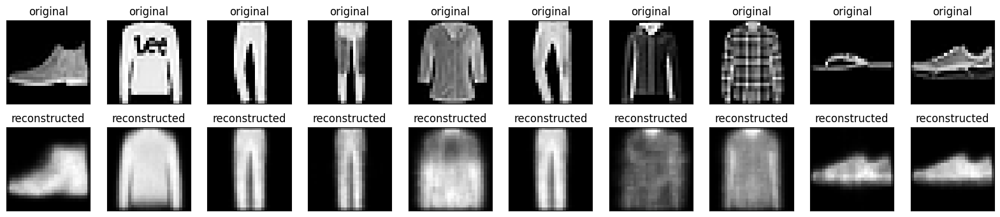

In [24]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
  # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i][0])
    plt.title("original")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

  # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i][0].detach().numpy())
    plt.title("reconstructed")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

(10, 2)
(10, 2)
(200, 2)
(10, 2)


/tmp/ipykernel_90227/2967621870.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  axes[1, i].set_title('({0:.2f}, {1:.2f})'.format(float(latent_repr[i, 0]), float(latent_repr[i, 1])))


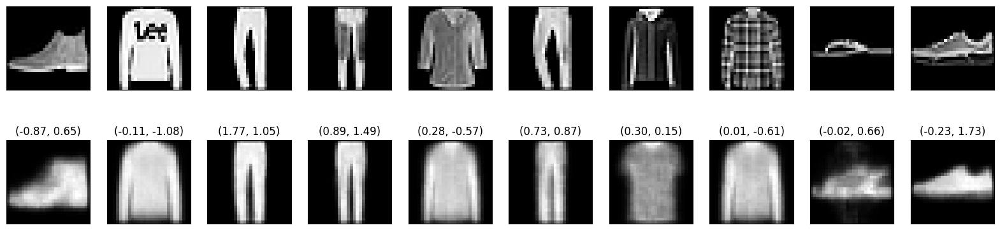

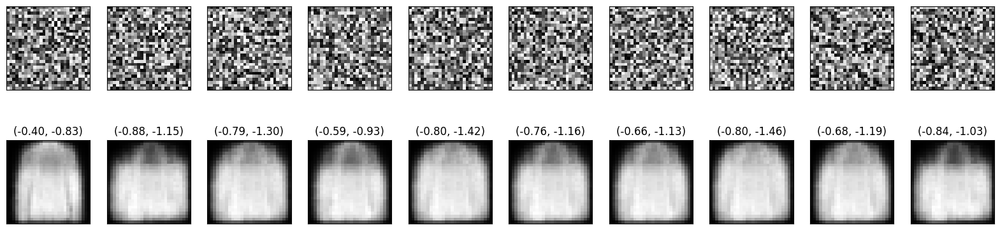

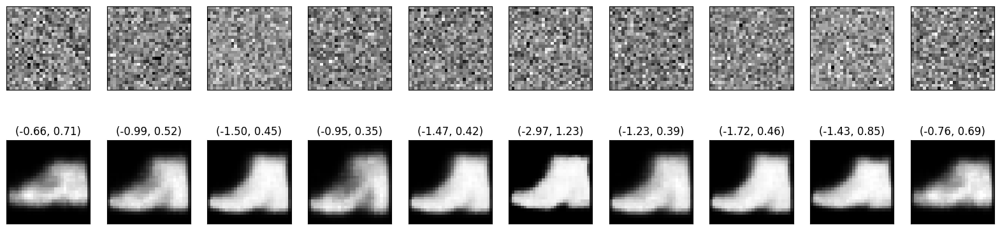

In [25]:
import scipy

def get_triple(inputs, model):
    latent_repr = model.encode(inputs)
    outputs = model.decode(latent_repr).detach().numpy()
    latent_repr = latent_repr.detach().numpy()
    print(latent_repr.shape)
    latent_repr = latent_repr.reshape((latent_repr.shape[0], latent_repr.shape[1], 1))

    return inputs, latent_repr, outputs

def show_encodings(inputs, latent_repr, outputs):
    n = len(inputs)
    fig, axes = plt.subplots(2, n, figsize=(2*n, 5))
    for i in range(n):
        axes[1, i].set_title('({0:.2f}, {1:.2f})'.format(float(latent_repr[i, 0]), float(latent_repr[i, 1])))
        axes[0, i].imshow(inputs[i].reshape(28, 28), cmap='gray')
        axes[1, i].imshow(outputs[i].reshape(28, 28), cmap='gray')
    for ax in axes.flatten():
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    
show_encodings(*get_triple(x_test[:10], model))

inputs = np.random.random(size=(10, 1, 28, 28))
inputs = torch.Tensor(inputs)
show_encodings(*get_triple(inputs, model))

_, latents, _ = get_triple(x_test, model)
latents = latents.ravel()

inputs = np.random.normal(loc=np.mean(latents), scale=2.72, size=(10, 1, 28, 28))
inputs = torch.Tensor(inputs)
show_encodings(*get_triple(inputs, model))

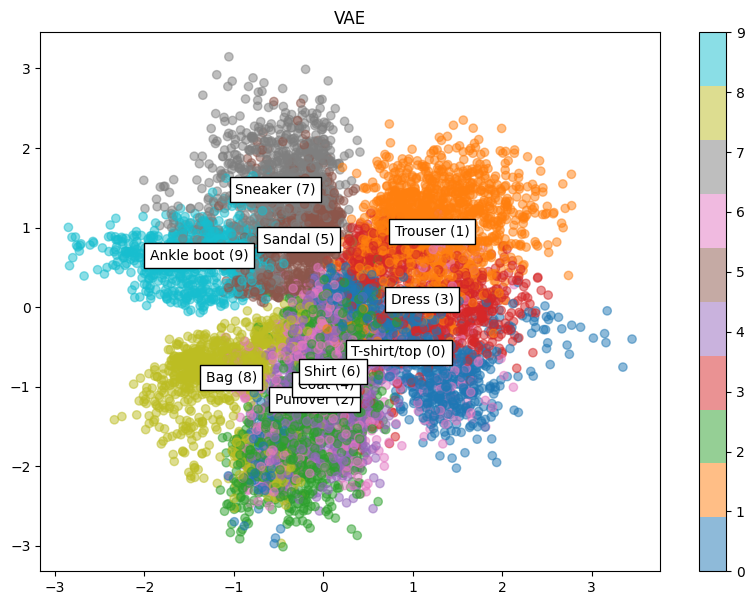

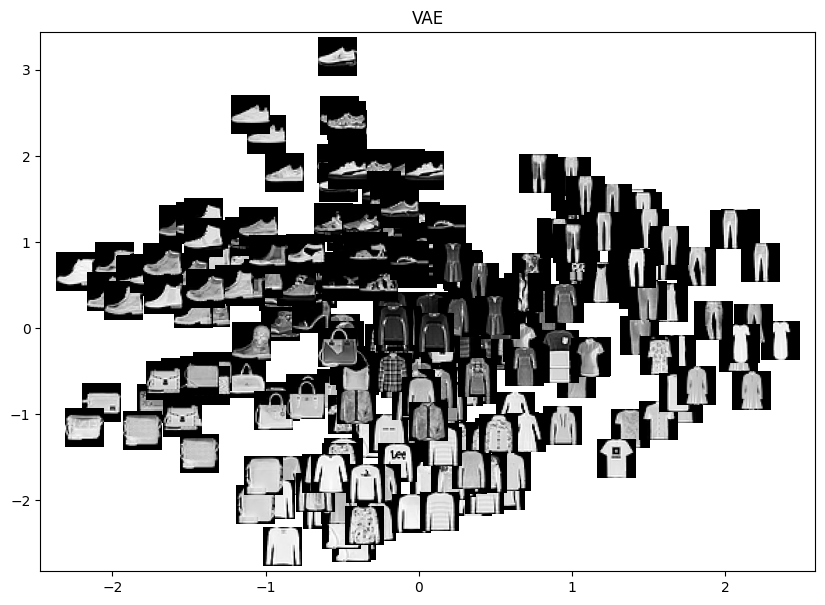

In [26]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox, TextArea

labeldict = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

def plot_latent(mode, count, technique):
    idx = np.random.choice(len(x_test), count)
    inputs = x_test[idx]
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title(technique)
    if technique == 'VAE':
        coords = model.encode(inputs).detach().numpy()

    if mode == 'imgs':
        for image, (x, y) in zip(inputs, coords):
            im = OffsetImage(image.reshape(28, 28), zoom=1, cmap='gray')
            ab = AnnotationBbox(im, (x, y), xycoords='data', frameon=False)
            ax.add_artist(ab)
        ax.update_datalim(coords)
        ax.autoscale()
    elif mode == 'dots':
        classes = y_test[idx]
        plt.scatter(coords[:, 0], coords[:, 1], c=classes, cmap='tab10', alpha=.5)
        plt.colorbar()
        for i in range(10):
            class_center = np.mean(coords[classes == i], axis=0)
            text = TextArea('{} ({})'.format(labeldict[i], i))
            ab = AnnotationBbox(text, class_center, xycoords='data', frameon=True)
            ax.add_artist(ab)
    plt.show()

plot_latent('dots', 10000, 'VAE')
plot_latent('imgs', 300, 'VAE')

# Полезные ссылки
* [Генерация музыки с помощью VAE](https://www.kaggle.com/code/basu369victor/generate-music-with-variational-autoencoder)
* [VAE на датасете H&M](https://www.kaggle.com/code/manatoyaguchi/h-m-variational-autoencoder-with-pytorch)
* [основная статья](https://arxiv.org/pdf/1906.02691.pdf)
* [Другая хорошая статья с объяснением математики](https://lilianweng.github.io/posts/2018-08-12-vae/)